<video style="display:block; width:100%; height:auto;" autoplay="" muted="" loop="loop">
    <source src="videos/optimal-peanut-butter-and-banana/banana_small.mp4" type="video/mp4">
</video>

<br>

I was personally useless for most of the Spring of 2020. There was a period of time, though, after the peak in coronavirus cases here in NYC and before the onslaught of police violence here in NYC that I managed to scrounge up the motivation to do something other than drink and maniacally refresh my Twitter feed. I set out to work on something completely meaningless. It was almost therapeutic to work on a project with no value of any kind (_insert PhD joke here_).

A side effect of having spent 10 years with limited income in college and grad school, 6 of those here in expensive ass NYC, is that I eat of lot of cheap sandwiches, even though I now have a nice Tech™ job. While my sandwich consumption was quite formidable pre-covid, sheltering in place cemented this staple in my diet. I am particularly fond of peanut butter and banana sandwiches, having been introduced to them as a child by my maternal grandfather who ate them regularly. 

I start a peanut butter and banana sandwich by spreading peanut butter on two slices of bread. I then slice circular slices of the banana, starting at the end of the banana, and place each slice on one of the pieces of bread until I have a single layer of banana slices. Every time I do this, the former condensed matter physicist in me starts to twitch his eye. You see, I have this urge, this desire, this _need_ to maximize the [packing fraction](https://en.wikipedia.org/wiki/Atomic_packing_factor) of the banana slices. That is, I want to maximize the coverage of the banana slices on the bread. Just as bowl-form food is perfect because you get every ingredient in every bite, each bite of my sandwich should yield the same golden ratio of bread, peanut butter, and banana.

If you were a machine learning model (or my wife), then you would tell me to just cut long rectangular strips along the long axis of the banana, but I'm not a sociopath. If life were simple, then the banana slices would be perfect circles of equal diameter, and we could coast along looking up optimal configurations on [packomania](http://packomania.com/). But alas, life is not simple. We're in the middle of a global pandemic, and banana slices are elliptical with varying size.

So, how do we make optimal peanut butter and banana sandwiches? It's really quite simple. You take a picture of your banana and bread, pass the image through a deep learning model to locate said items, do some nonlinear curve fitting to the banana, transform to polar coordinates and "slice" the banana along the fitted curve, turn those slices into elliptical polygons, and feed the polygons and bread "box" into a 2D nesting algorithm. 

You may have noticed that I supposedly started this project in the Spring, and it's now August. Like most idiot engineers, I had no idea how complicated this stupid project was going to be, but time's meaningless in quarantine, so here we are. And here you are! Because I made a pip installable python package [nannernest](https://github.com/EthanRosenthal/nannernest) if you want to optimize your own sandwiches, and I'm going to spend the rest of this post describing how this whole godforsaken thing works.

## Sandwich Segmentation

I know that deep learning has been properly commoditized when the easiest part of this project was identifying every pixel that belongs to a banana or slice of bread in an image. Seriously, this step was super easy. I used a pretrained Mask-RCNN torchvision [model](https://pytorch.org/docs/stable/torchvision/models.html#torchvision.models.detection.maskrcnn_resnet50_fpn) with a Resnet backbone. The model was pretrained on the COCO [dataset](https://cocodataset.org/), and thankfully the dataset has "banana" as segmentation category, along with "sandwich" and "cake" which were close enough categories for suitable detection of most slices of bread.

Passing an image through the model outputs a bunch of detected objects, where each detected object has an associated `label`, `score`, `bounding box`, and `mask`, where the mask identifies the pixels that correspond to the object with a weight at each pixel corresponding to the model's confidence in that pixel's label.

Because there could be multiple bananas and slices of bread in the image, I pick out the banana and slice of bread with the highest score. Below, you can see the model is clearly able to identify the banana and bread, with the mask overlaid in a semi-transparent, radioactive green.

In [1]:
%config InlineBackend.figure_format = 'retina'

from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import nannernest

_RC_PARAMS = {
    "figure.figsize": (8, 4),
    "axes.labelsize": 16,
    "axes.titlesize": 18,
    "axes.spines.right": False,
    "axes.spines.top": False,
    "font.size": 14,
    "lines.linewidth": 2,
    "lines.markersize": 6,
    "legend.fontsize": 14,
}
for k, v in _RC_PARAMS.items():
    plt.rcParams[k] = v

DPI = 160

In [2]:
image, banana, bread = nannernest.segmentation.run(Path("pre_sandwich.jpg"))

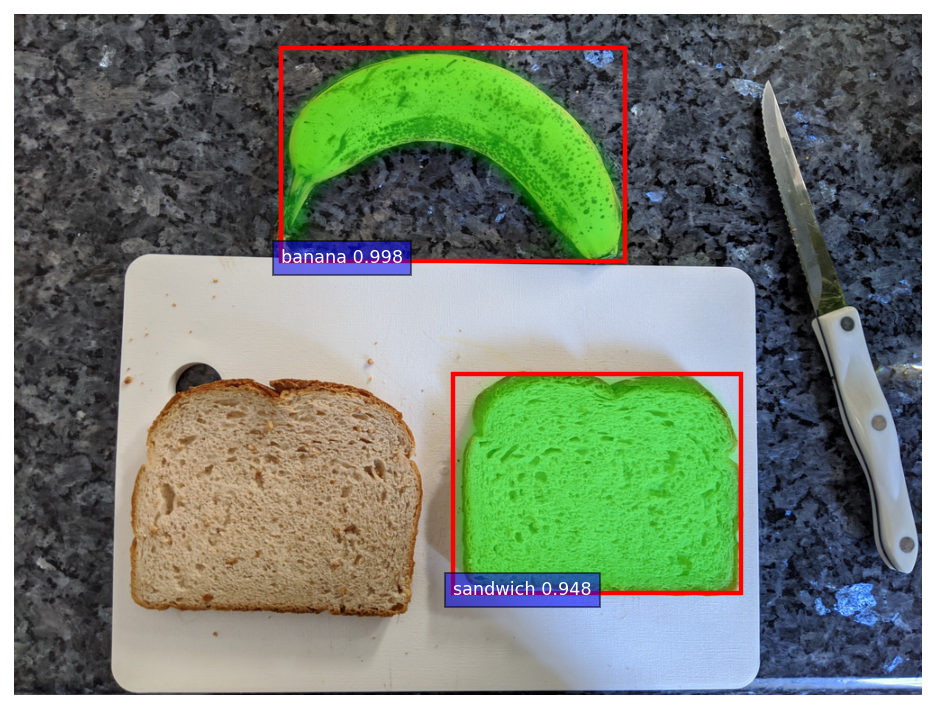

In [3]:
nannernest.viz.plot(image, banana=banana, bread=bread, show=True, dpi=DPI)

## [What shape does a banana make?](https://www.youtube.com/watch?v=3O1ad4lZYGk)


Now that we have identified the banana in the image, we need to virtually "slice" it. This is where we are first introduced to the universal pain of computer vision: 

_By eye, I can see exactly what I want to do; by code, it's so damn difficult._

I could ask you to draw lines on the banana identifying where you would slice it, and you could easily draw well-spaced, somewhat parallel slices. It's not so easy to do this with code. However, I would also argue that this is the fun part of the problem. There are many ways to solve this, and it feels creative, as opposed to using a pre-trained deep learning model. On the other hand, "creatively" solving these problems likely leads to more brittle solutions compared to deep learning models trained on millions of examples. There's a tradeoff here.

I tried a bunch of analytical solutions based on ellipses, but nothing seemed to work quite right. I ended up landing on a somewhat simpler solution that may not be robust to straight bananas, but who cares -- this is a silly project anyway. Using the wonderful [scikit-image](https://scikit-image.org/) library, I first calculate the [skeleton](https://scikit-image.org/docs/dev/auto_examples/edges/plot_skeleton.html) of the banana segmentation mask. This reduces the mask to a one pixel wide representation which effectively creates a curve that runs along the long axis of the banana.

In [4]:
slices, banana_circle, banana_centroid, banana_skeleton = nannernest.slicing.run(
    banana.mask
)

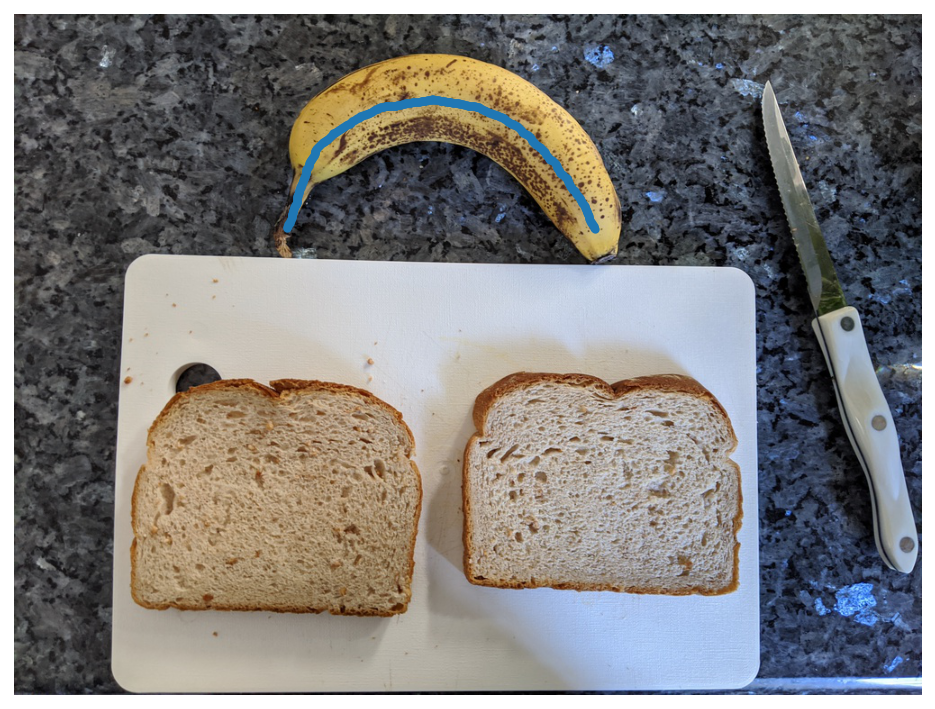

In [5]:
nannernest.viz.plot(image, banana_skeleton=banana_skeleton, show=True, dpi=DPI)

I then fit a circle to the banana skeleton using a nice scipy-based least squares optimization I found [here](https://scipy-cookbook.readthedocs.io/items/Least_Squares_Circle.html#Using-scipy.optimize.leastsq). I actually originally tried to fit this with PyTorch and totally failed, likely due to the fact that this is actually a nonlinear optimization problem.

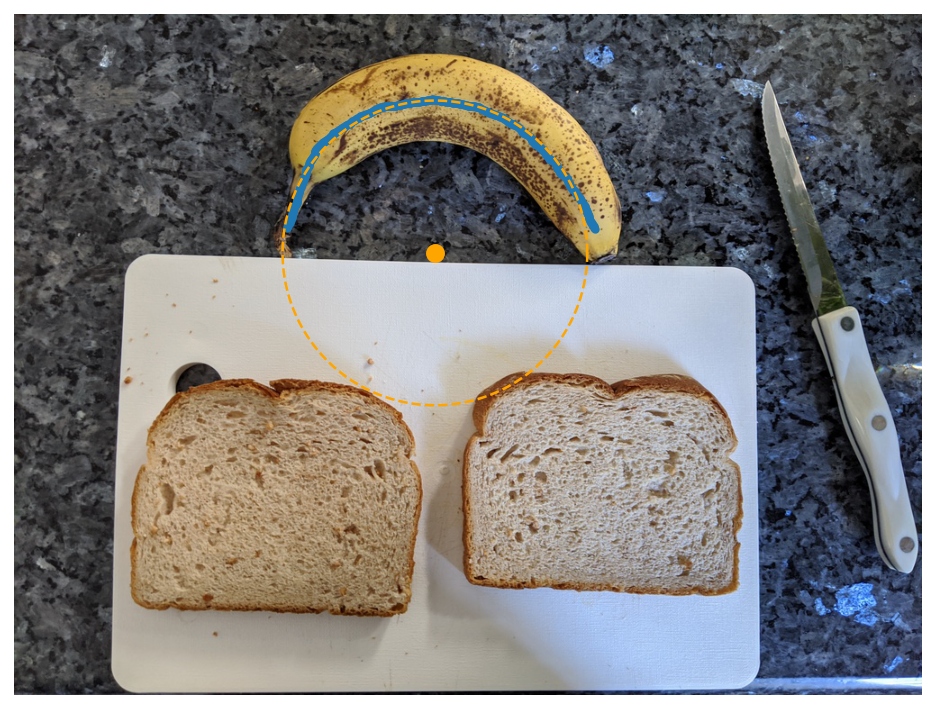

In [6]:
nannernest.viz.plot(
    image,
    banana_skeleton=banana_skeleton,
    banana_circle=banana_circle,
    show=True,
    dpi=DPI,
)

## Rad Coordinate Transformations

With the circle fit to the banana, the goal is to now draw radial lines out from the center of the circle to the banana and have each radial line correspond to the slice of a knife. Again, while it's easy to visualize this, it's much harder in practice. For example, we need to start slicing at one end of the banana, but how do we find an end of the banana? Also, there are two ends, and we have to differentiate between them. Contrary to the behavior of [monkeys](https://www.thekitchn.com/why-you-should-peel-your-banana-like-a-monkey-206322), I start slicing my bananas at the stem end, and that's what we're going to do here.

Crucially, because we now have this circle and want to cut radial slices, we must transform from cartesian to polar coordinates and orient ourselves both radially and angularly with respect to the banana. As a start for orienting ourselves angularly, we calculate the _centroid_ of the banana mask, which corresponds to the center of mass of the banana mask if the banana mask were a 2D object. The centroid is shown below as a red dot.

We now draw a radial line originating from the banana circle and passing through the centroid, shown as the dashed white line below. We will consider that line to mark our _reference_ angle which orients us to the center of the banana.

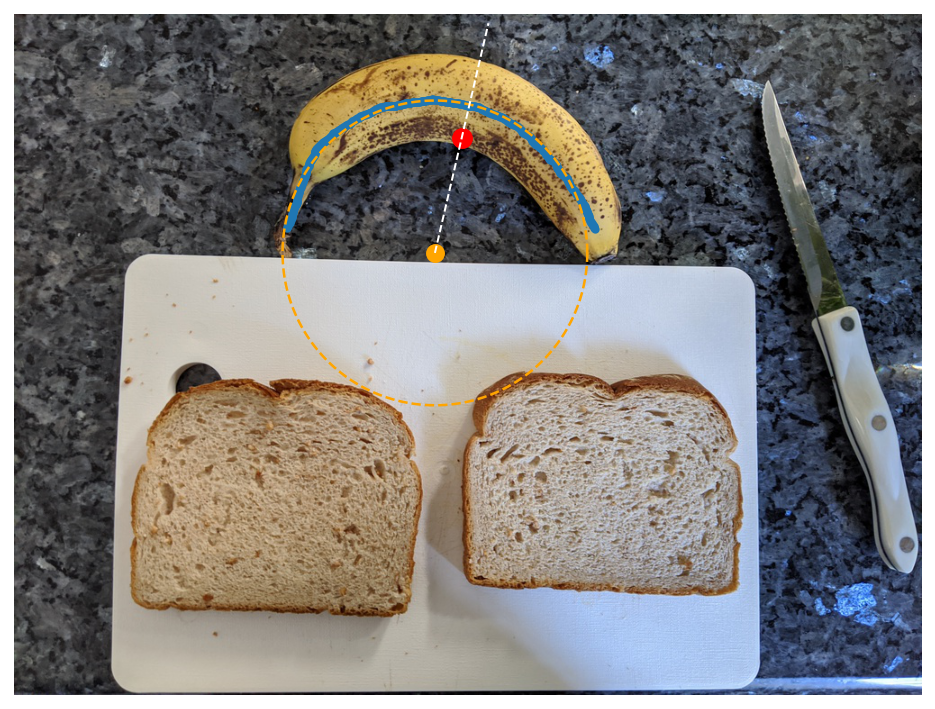

In [7]:
ax = nannernest.viz.plot(
    image,
    banana_skeleton=banana_skeleton,
    banana_circle=banana_circle,
    banana_centroid=banana_centroid,
    show=False,
    dpi=DPI,
)

dy = banana_centroid[0] - banana_circle.yc
dx = banana_centroid[1] - banana_circle.xc
reference_angle = np.arctan2(dy, dx)
radius = np.sqrt(dx ** 2 + dy ** 2)

radial_end_point = (
    banana_circle.xc + 2 * radius * np.cos(reference_angle),
    banana_circle.yc + 2 * radius * np.sin(reference_angle),
)

ax.plot(
    (banana_circle.xc, radial_end_point[0]),
    (banana_circle.yc, radial_end_point[1]),
    color="white",
    linestyle="--",
    linewidth=1,
)
None

Using `scikit-image`, we calculate the segmentation `mask` intensity along this radial line using the `profile_line` function. Because our line is passing at an angle along discrete `mask` pixels (aka matrix entries), we take an average of neighboring points along the radial line cut using the `linewidth` arguments. As you can see, the banana mask pops out a little over 100 points from the banana circle center. 

In [8]:
from skimage import measure

profile_line = measure.profile_line(
    banana.mask.T, banana_circle.center, radial_end_point, linewidth=2, mode="constant"
)

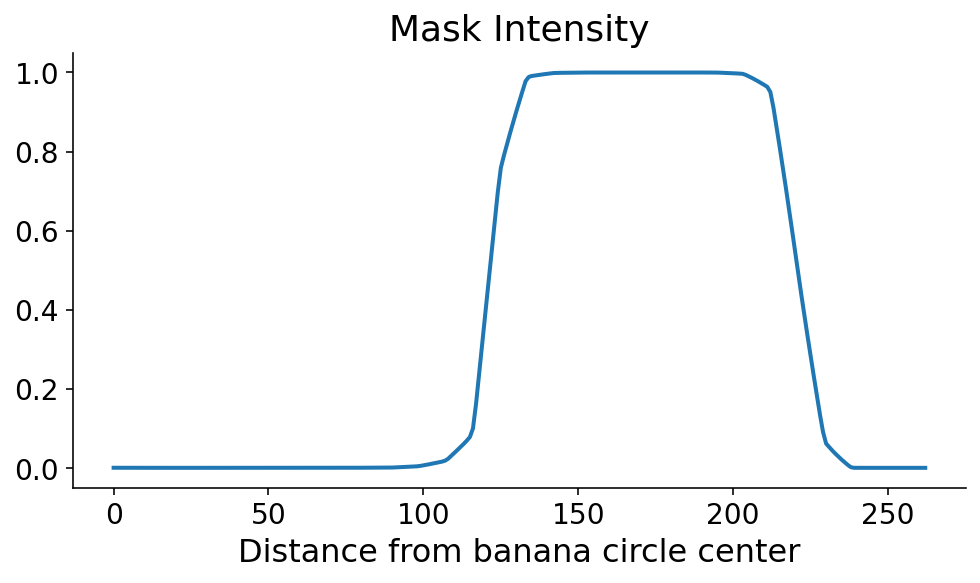

In [9]:
fig, ax = plt.subplots()
ax.plot(profile_line)
ax.set_xlabel("Distance from banana circle center")
ax.set_title("Mask Intensity")
None

This profile line is what allows us to orient ourselves radially. You can clearly see where the banana starts and ends, in the radial direction. As always, just seeing it is not good enough. We need code to define the start and end of the banana in this direction. The `mask` tends to be monotonically increasing and then monotonically decreasing along the start and end, respectively. Using this information, there are a couple ways that we could define the start and the end. If the steepest parts of the profile line occur at the start and end, then the start and end would correspond to the maximum and minimum derivatives, respectively. I'm a little nervous about noise in the `mask` signal when the model confidence is low, so I first digitize (or threshold) the profile line by setting it to 0 (1) if it's less than (greater than) 0.5. 

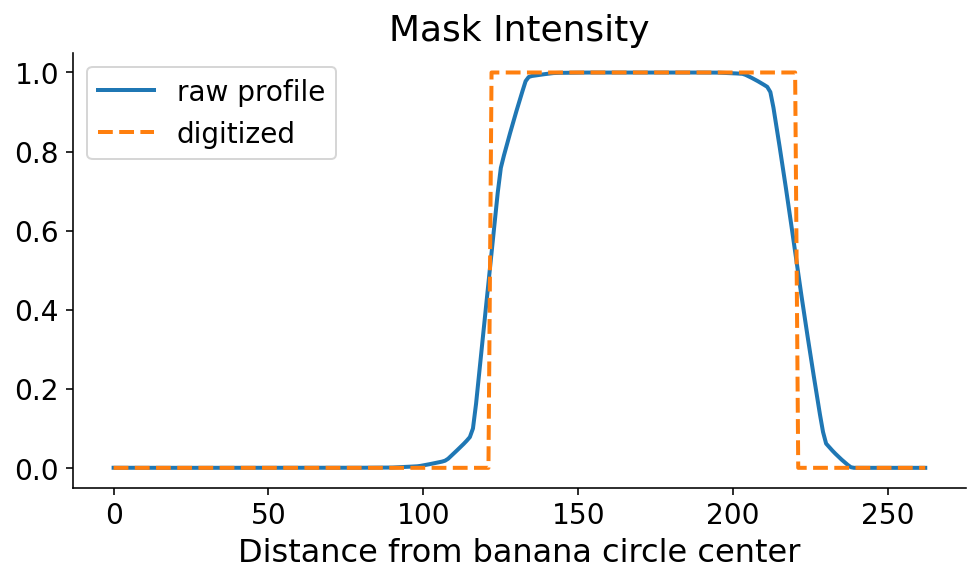

In [10]:
digitized = profile_line > 0.5

fig, ax = plt.subplots()
ax.plot(profile_line, label="raw profile")
ax.plot(digitized, "--", label="digitized")
ax.legend()
ax.set_xlabel("Distance from banana circle center")
ax.set_title("Mask Intensity")
None

We now search for the points where the signal flips in terms of the maxmimum and minimum derivatives of the digitized signal. This can be done with some quick `numpy`. It's still a dangerous (quote: "dangerous", it's a banana) operation which could amplify noise. One option in the future would be to smooth the profile line prior to taking the derivative.

In [11]:
diff = np.diff(digitized, append=0)
start, end = np.argmax(diff), np.argmin(diff)

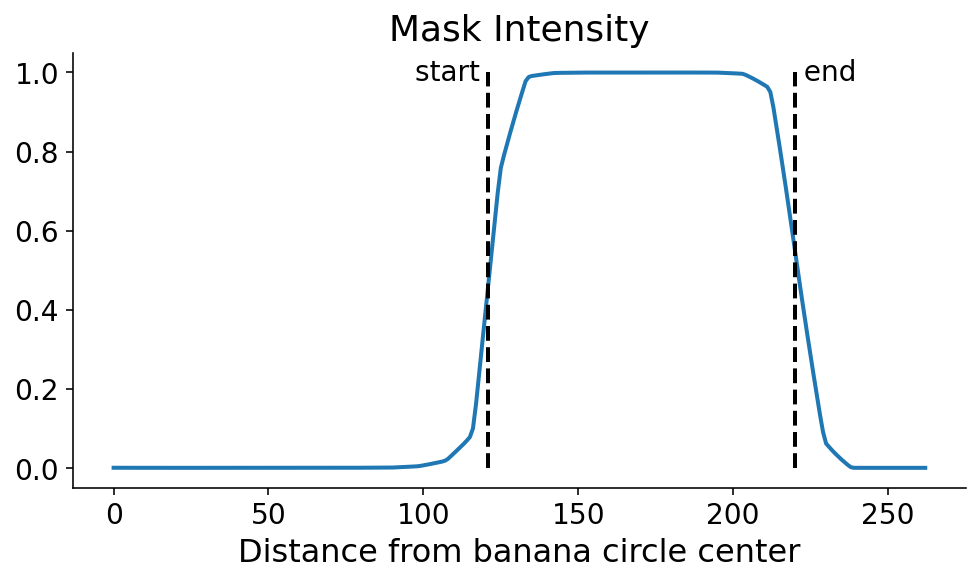

In [12]:
fig, ax = plt.subplots()
ax.plot(profile_line)
ax.plot((start, start), (0, 1), "k--")
ax.plot((end, end), (0, 1), "k--")
ax.annotate("start ", (start, 1), ha="right", va="center")
ax.annotate(" end", (end, 1), ha="left", va="center")
ax.set_xlabel("Distance from banana circle center")
ax.set_title("Mask Intensity")
None

## $\phi$-Space

We are now able to orient ourselves angularly with respect to the center of the banana and radially in terms of the start and end of the banana along the radial line. The last step is the find the _angular_ start and end of the banana, where the angular start will correspond to the angle pointing to the stem of the banana. To that end, we start by creating an array of angles which span from the reference centroid angle _minus_ 135$^{\circ}$ to the reference angle _plus_ 135$^{\circ}$. Analogous to numpy's `linspace`, we'll call this array $\phi$-space.

For each angle in $\phi$-space, we'll calculate a profile line like we did above. Below, we create a $\phi$-space of 201 points and draw each of these profile lines on the original image. You can see that they clearly cover the banana with some healthy room on either angular side.



In [13]:
phi_space = nannernest.slicing.create_phi_space(
    banana_centroid, banana_circle, num_points=201
)
profiles = nannernest.slicing.assemble_profiles(
    phi_space, banana.mask, banana_circle, linewidth=2
)

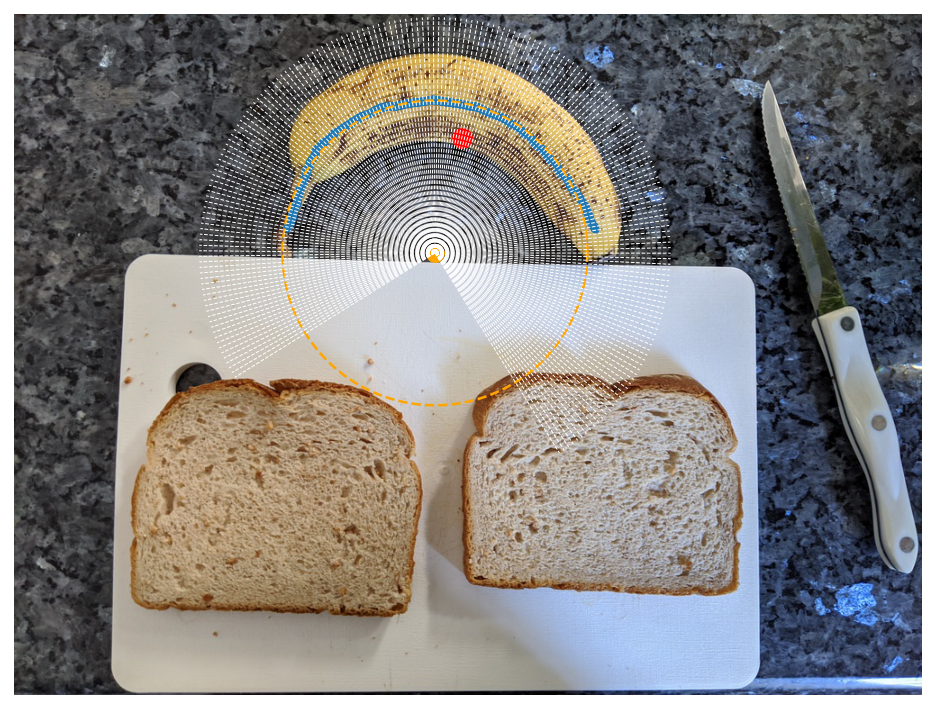

In [14]:
ax = nannernest.viz.plot(
    image,
    banana_skeleton=banana_skeleton,
    banana_circle=banana_circle,
    banana_centroid=banana_centroid,
    show=False,
    dpi=DPI,
)
for phi in phi_space:
    radial_end_point = (
        banana_circle.xc + 2 * radius * np.cos(phi),
        banana_circle.yc + 2 * radius * np.sin(phi),
    )
    ax.plot(
        (banana_circle.xc, radial_end_point[0]),
        (banana_circle.yc, radial_end_point[1]),
        color="white",
        linestyle="--",
        linewidth=0.5,
    )

We can also stack all of the profile lines on each other such that we have a matrix where the rows are angles, the columns denote radial distance, and the values are the `mask` intensities along these lines. A false-color plot of this matrix below shows the banana. The long axis of the banana roughly runs along the $\phi$-space direction. The small bit of banana at the top corresponds to the banana stem. The $\phi$-space angles are with respect to the horizontal axis.

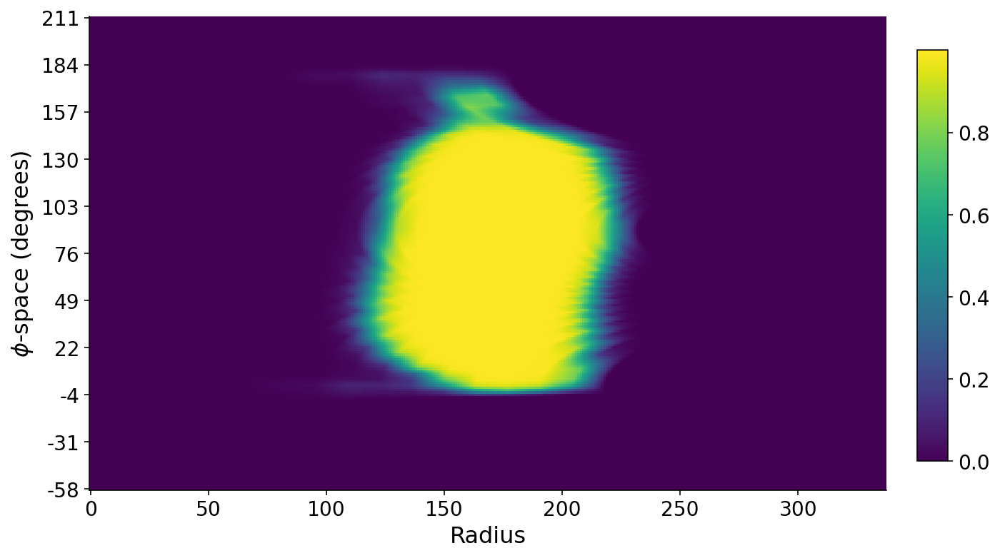

In [15]:
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(profiles)

ax.set_xlabel("Radius")
ax.set_ylabel("$\phi$-space (degrees)")
ticks = np.linspace(0, len(phi_space) - 1, 11, dtype=np.int32)

ax.set_yticks(ticks)
ax.set_yticklabels((phi_space[ticks] * 180 / np.pi).astype(int))

plt.colorbar(im, cax=fig.add_axes([0.93, 0.3, 0.03, 0.4]))
None

## Slicing from Stem to Seed

Finally, with this odd matrix above that represents this polar world warped onto a cartesian plot, we can identify both the banana stem and the opposite end of the banana which houses its seed. I find the two ends of the banana using a similar method to earlier for finding the radial start and end of the banana. I then find the average mask intensity in a region around either end of the banana and assume that the stem has a smaller average intensity. Finally, I virtually "chop off" the stem using the knowledge that the seed side of the banana should have similar average intensity to the stem side sans stem.

With this work done, I've now identified the angular position of the stem and seed of the banana, along with the radial start and end of the banana at any angle. I slice the banana by chopping it up into evenly spaced angles and drawing a rectangular slice at each angle spacing. I leave as a free parameter the total number of slices which implicitly determines the banana slice thickness. By default, I slice 23 slices and throw out the first and last slice (nobody wants those).

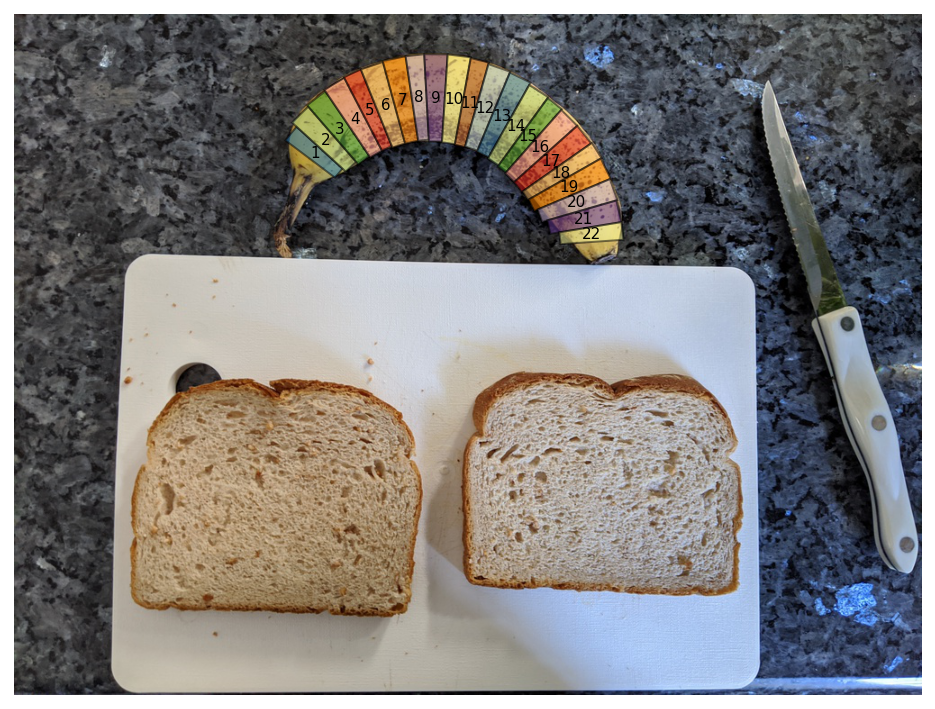

In [16]:
nannernest.viz.plot(image, slices=slices, show=True, dpi=DPI)

## Ellipsoidal Assumptions

We now have to make two assumptions about the banana slices. Firstly, we know that the banana slices will be smaller than the ones shown above because the peel has finite thickness. Secondly, bananas are not perfectly circular, and the slices will come out as ellipses. Based on a couple poor measurements with a tape measure (I don't have calipers), I assume that the actual banana slices are 20% smaller than the image above with the banana peel. I also take the slices in the image above to represent the major axis of the banana slice ellipse, and assume that the minor axis is 85% the size of the major axis.

With these assumptions in place, slice 1 shown above looks like

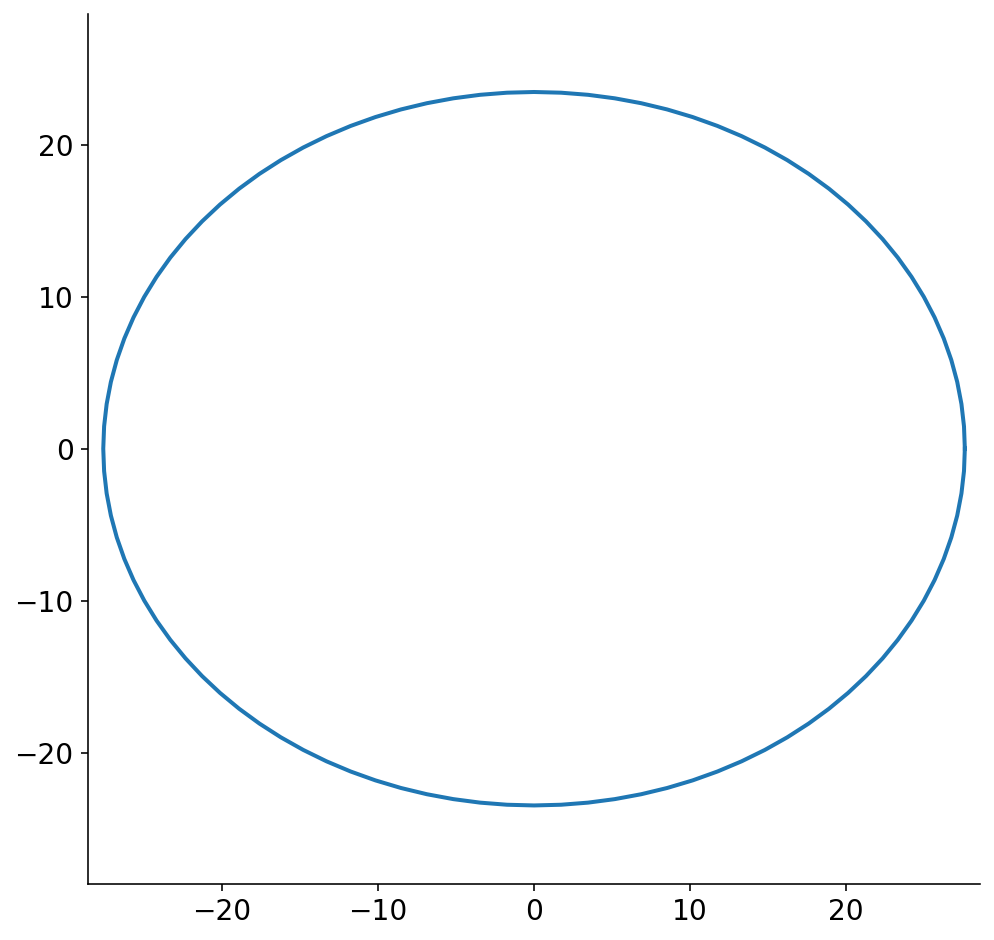

In [17]:
fig, ax = plt.subplots(figsize=(8, 8))
theta = np.linspace(0, 2 * np.pi, 101)
ax.plot(
    (slices[0].major_axis / 2) * np.cos(theta),
    (slices[0].minor_axis / 2) * np.sin(theta),
)
lim = slices[0].major_axis / 2 + 1
ax.set_xlim((-lim, lim))
ax.set_ylim((-lim, lim))
None

Prior to the final step of this ridiculously long pipeline, we have to convert the ellipsoidal slices into _polygons_. Technically, the plot above is a discrete set of points and could be considered a polygon. To make the problem tractable, though, we reduce the ellipse to a small set of points. When I first started working on this problem, I did not know if I was going to be severely limited in how many points I could allot for each slice polygon. I'm also somewhat neurotic (a mild understatement) and worried about the fact that the polygon will necessarily not be the exact same size as the ellipse. 

To solve this, I wanted to figure out the polygon that _circumscribes_ the ellipse. I was surprised to not find any code for this, so I ended up trying to solve it analytically. The resulting algebra was pretty gnarly, so there's now a function in `nannernest` that runs [sympy](https://www.sympy.org/en/index.html) and calculates the scaling factors for the major and minor axes based on the number of points in the ellipse polygon. 

Below, I draw the ellipse and the circumscribed polygon for a polygon of 12 points. While (by definition) the circumscribed polygon is bigger than the ellipse, the difference is quite small. I probably could have just chopped the original ellipse into 12 points without much loss in accuracy. In practice, I've been using 30 points which only makes the difference even smaller. Also, FWIW, I think that my algebra only works if there are polygon points directly along the x and y axes, so there you go. If anybody has a closed form solution to this, I'd love to see it!

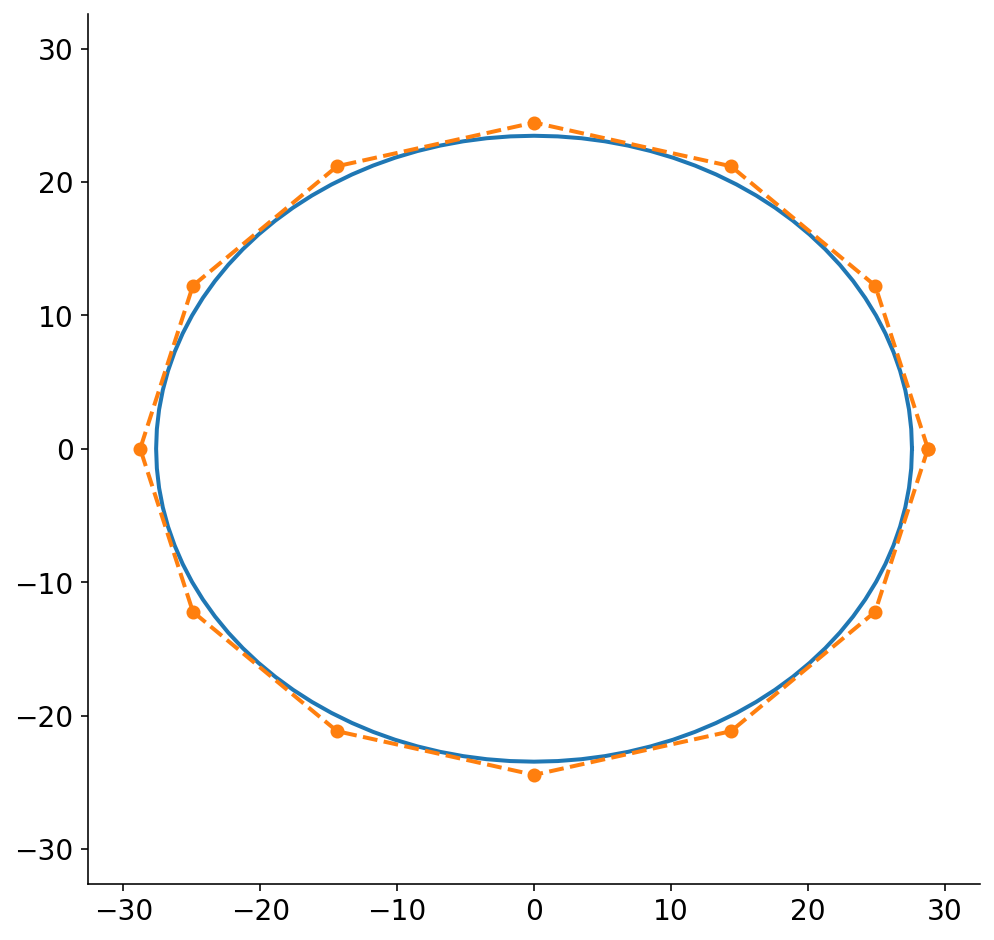

In [18]:
fig, ax = plt.subplots(figsize=(8, 8))
theta = np.linspace(0, 2 * np.pi, 101)
slice_x = (slices[0].major_axis / 2) * np.cos(theta)
slice_y = (slices[0].minor_axis / 2) * np.sin(theta)
ax.plot(slice_x, slice_y)
lim = max(slice_x.max(), slice_y.max()) + 5

num_points = 12
major_scaler, minor_scaler = nannernest.nesting.calc_elliptical_polygon_scalers(
    num_points
)
poly = nannernest.nesting.ellipse_to_polygon(
    slices[0], num_points, major_scaler, minor_scaler
)
ax.plot(*zip(*poly), "o--")

ax.set_xlim((-lim, lim))
ax.set_ylim((-lim, lim))
None

## Bread Box

This part was pretty quick. I needed to define the bread as a "box" within which to nest my banana slices. Originally, I just used the `bounding box` from the segmentation algorithm. However, the `bounding box` just defines the maximum boundary of the bread. On a whim, I tried rotating an image by 30$^{\circ}$ (sorry, I performed "data augmentation"), and I found that the bounding box did not rotate with the bread. Thankfully, I had the segmentation `mask`, and I grabbed a [rotating calipers](https://chadrick-kwag.net/python-implementation-of-rotating-caliper-algorithm/) python implementation to find the minimum area bounding box that contains the `mask`.


## Slices in a Nest

By the time I finally got to the point of having polygonal, ellipsoidal banana slices extracted from an image and a nice bread box, I thought I would be home free. Surely, there is a simple algorithm that I can plug the polygons and box into to maximize coverage? It turns out that this type of problem commonly called "nesting" or "packing" is extremely hard. Like, NP-hard. Surprisingly, this is a popular research areas because there are a whole bunch of applications. Close packing polygons is analogous to trying to use the most material when cutting a sheet of metal with a CNC machine or cutting out clothing patterns from fabric. I even saw that an application of nesting ellipses involves injecting dye into the brain for imaging. The dye spreads out as an ellipse, and one wants maximum coverage with the fewest number of injections.

I originally set out to find an analytical solution to packing ellipses in a box, but this does not seem to really exist. As time went on, I settled for _any_ decent solution to nesting polygons in a box. The popular solutions tend to involve placing polygons one at a time in the box. Each polygon touches the previous polygon. One often starts at a corner of the box, and fills it up row by row. This sounds simple, but you have to build up a bunch of code to touch two polygons without them overlapping. The polygons can also be rotated, placed in whatever order you want, etc... The combinatorial search space is massive, so people often employ the following optimizations

1. Find a quick method to determine all of the possible points at which two polygons can touch. This is done via the [No-fit polygon](https://www.sciencedirect.com/science/article/abs/pii/S0377221706001639)
1. Cache the results of 1.
1. Choose the order of your polygons in a smart way, like biggest first.
1. Define an overall objective and then employ a black box optimizer to search the space more efficiently. The space involves things like order of polygon placement and the angle of the polygon when it's placed.


For months, I waffled back and forth between searching GitHub for implementations and trying to code up my own. One night I would spend 3 hours failing to compile C dependencies, while the next night I would read academic papers and hack away. In the end, I got about halfway to a solution before stumbling upon [nest2D](https://github.com/markfink/nest2D) which provides python bindings for a C++ [library](https://github.com/tamasmeszaros/libnest2d/tree/master). Figuring out this library's C dependencies wasn't [too bad](https://github.com/markfink/nest2D/pull/2). The only output of the library is an SVG file with a fixed rectangular shape containing images of the nested polygons, so I have to parse the SVG afterwards, scale the polygons back to their original image, then translate and rotate them to overlay with the original bread box. Nevertheless, this all ended up being easier than finishing my own library.

Thankfully, the nesting library is quite fast, so I start with 2 banana slices and keep running the nesting algorithm with more and more slices until no more can be added. 

And in the end, we finally get the banana slices nested in the bread box.

In [19]:
slices, bread_box = nannernest.nesting.run(slices, bread)

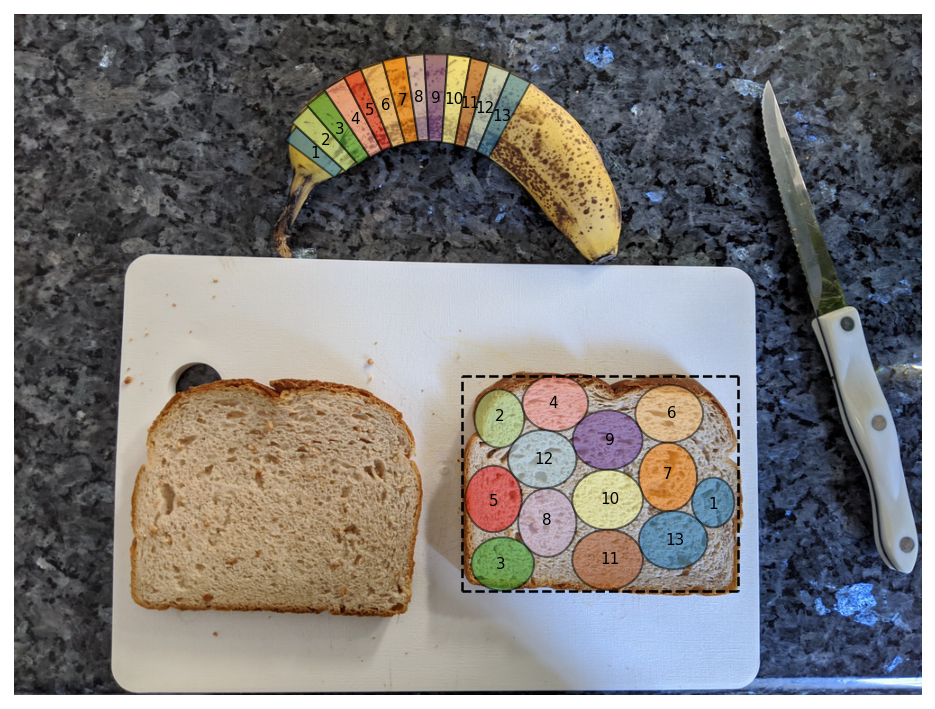

In [20]:
nannernest.viz.plot(image, slices=slices, bread_box=bread_box, show=True, dpi=DPI)

## nannernest

As mentioned at the beginning, I built a package called [nannernest](https://github.com/EthanRosenthal/nannernest) for you to make your own optimal peanut butter and banana sandwiches. Once you get the package installed, you can generate your own optimal sandwiches on the command line with:

```commandline
$ nannernest pic_of_my_bread_and_banana.jpg
```

A couple random reflections on building this package:

- It's difficult to transition between different "reference frames" when doing computer vision. Images are matrices, and their x-direction when plotted corresponds to columns, which are the second index of the matrix. Conversely, we often deal with points or sets of points where the first index coresponds to the x direction. This gets confusing. I often had to convert between cartesian and polar coordinates and place an object in the larger image. Keeping track of your coordinate systems and scaling factors can be difficult, and it's probably worth doing this in a smart way. I didn't really do that.
- [Typer](https://typer.tiangolo.com/) is pretty great for building command line applications. 
- [poetry](https://python-poetry.org/) makes package development less painful.
- [dataclasses](https://docs.python.org/3/library/dataclasses.html) are a good reason to upgrade to Python 3.7.
- There are many, many improvements that could be made. The package is not robust and fails in weird ways. Slices often end up off the corner of the bread due to me using a bounding box to define the bread rather than the actual outline of the bread. I shudder to think of the adversarial attacks that this poor package will receive (think hot dog/not hot dog...).

## An Optimal Peanut Butter and Banana Sandwich

Lately, my preference is

- Peanut Butter & Co [Smooth Operator](https://ilovepeanutbutter.com/collections/peanut-butter/products/smooth-operator)
- Dave's [White Bread Done Right](http://www.daveskillerbread.com/white-bread-done-right)
- Bananas from the food stand guy at 22nd and 8th, although most NYC produce is shit.

Best of luck with your sandwich making. I wish you optimal coverage.


<img style='width: 640px; padding: 10px'  src='images/optimal-peanut-butter-and-banana/pre_made_small.jpg' />
<img style='width: 640px; padding: 10px'  src='images/optimal-peanut-butter-and-banana/pre_made_viz_small.jpg' />
<img style='width: 640px; padding: 10px'  src='images/optimal-peanut-butter-and-banana/made_small.jpg' />
